In [1]:
import numpy as np
import xgboost as xgb
import pandas as pd
import matplotlib
import numpy as np
import pandas as pd
from sklearn import ensemble
from sklearn.linear_model import LinearRegression
from sklearn.cross_validation import cross_val_score
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn import manifold, decomposition, linear_model, ensemble, neighbors, cross_validation
import sklearn
%pylab inline


Populating the interactive namespace from numpy and matplotlib


/home/ubuntu/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
def r_metric(x,y):
    tmp = 1.0 - ((x - y) ** 2.0).sum() / ((x - x.mean()) ** 2.0).sum()
    return np.sign(tmp) * np.sqrt(np.abs(tmp)) * 1.0

In [3]:
with pd.HDFStore("train.h5", "r") as train:
    # Note that the "train" dataframe is the only dataframe in the file
    df = train.get("train")

In [6]:
df[:10]

,id,timestamp,derived_0,derived_1,derived_2,derived_3,derived_4,fundamental_0,fundamental_1,fundamental_2,...,technical_36,technical_37,technical_38,technical_39,technical_40,technical_41,technical_42,technical_43,technical_44,y
0,10,0,0.370326,-0.006316,0.222831,-0.213030,0.729277,-0.335633,0.113292,1.621238,...,0.775208,NaN,NaN,NaN,-0.414776,NaN,NaN,-2.0,NaN,-0.011753
1,11,0,0.014765,-0.038064,-0.017425,0.320652,-0.034134,0.004413,0.114285,-0.210185,...,0.025590,NaN,NaN,NaN,-0.273607,NaN,NaN,-2.0,NaN,-0.001240
2,12,0,-0.010622,-0.050577,3.379575,-0.157525,-0.068550,-0.155937,1.219439,-0.764516,...,0.151881,NaN,NaN,NaN,-0.175710,NaN,NaN,-2.0,NaN,-0.020940
3,25,0,NaN,NaN,NaN,NaN,NaN,0.178495,NaN,-0.007262,...,1.035936,NaN,NaN,NaN,-0.211506,NaN,NaN,-2.0,NaN,-0.015959
4,26,0,0.176693,-0.025284,-0.057680,0.015100,0.180894,0.139445,-0.125687,-0.018707,...,0.630232,NaN,NaN,NaN,-0.001957,NaN,NaN,0.0,NaN,-0.007338
5,27,0,0.346856,0.166239,-6.080701,-0.992249,-0.125916,0.345812,NaN,-0.584239,...,-0.379366,NaN,NaN,NaN,-0.001957,NaN,NaN,-2.0,NaN,0.031425
6,31,0,0.072036,0.014931,NaN,0.014063,NaN,-0.193205,NaN,NaN,...,1.232558,NaN,NaN,NaN,0.350685,NaN,NaN,-2.0,NaN,-0.032895
7,38,0,0.300062,0.071251,-0.074451,-0.065292,-0.011286,0.026365,0.210249,0.167494,...,0.242646,NaN,NaN,NaN,-0.168077,NaN,NaN,-2.0,NaN,0.015803
8,39,0,-0.003511,-0.034270,0.082372,-0.023937,-0.025750,0.007815,0.263451,-0.241212,...,0.186175,NaN,NaN,NaN,-0.300842,NaN,NaN,-2.0,NaN,-0.027593
9,40,0,-0.083330,0.081935,-2.048438,-0.206856,-0.839563,-0.234100,-0.291853,-5.722336,...,-0.021965,NaN,NaN,NaN,-0.386579,NaN,NaN,-2.0,NaN,0.006662


In [5]:
len(df.timestamp.unique())

1813

In [6]:
df.shape

(1710756, 111)

In [8]:
df.columns[:100]

Index([u'id', u'timestamp', u'derived_0', u'derived_1', u'derived_2',
       u'derived_3', u'derived_4', u'fundamental_0', u'fundamental_1',
       u'fundamental_2', u'fundamental_3', u'fundamental_5', u'fundamental_6',
       u'fundamental_7', u'fundamental_8', u'fundamental_9', u'fundamental_10',
       u'fundamental_11', u'fundamental_12', u'fundamental_13',
       u'fundamental_14', u'fundamental_15', u'fundamental_16',
       u'fundamental_17', u'fundamental_18', u'fundamental_19',
       u'fundamental_20', u'fundamental_21', u'fundamental_22',
       u'fundamental_23', u'fundamental_24', u'fundamental_25',
       u'fundamental_26', u'fundamental_27', u'fundamental_28',
       u'fundamental_29', u'fundamental_30', u'fundamental_31',
       u'fundamental_32', u'fundamental_33', u'fundamental_34',
       u'fundamental_35', u'fundamental_36', u'fundamental_37',
       u'fundamental_38', u'fundamental_39', u'fundamental_40',
       u'fundamental_41', u'fundamental_42', u'fundamental_4

In [10]:
for i in

1


In [29]:
len(df.id.unique())

1424

In [43]:
id11 = df[df.id == 11][['timestamp', 'y']]

In [45]:
id11[:4]

,timestamp,y
1,0,-0.001240
751,1,-0.002024
1501,2,0.008788
2251,3,-0.006551


Populating the interactive namespace from numpy and matplotlib


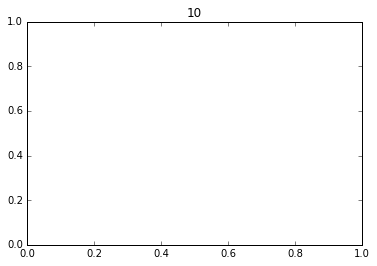

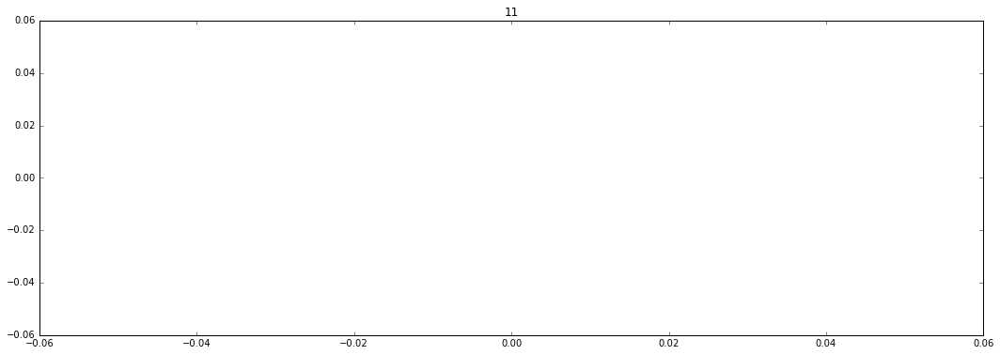

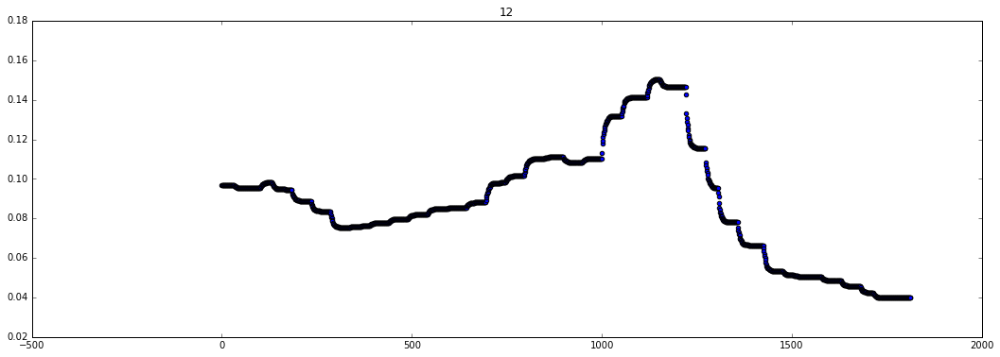

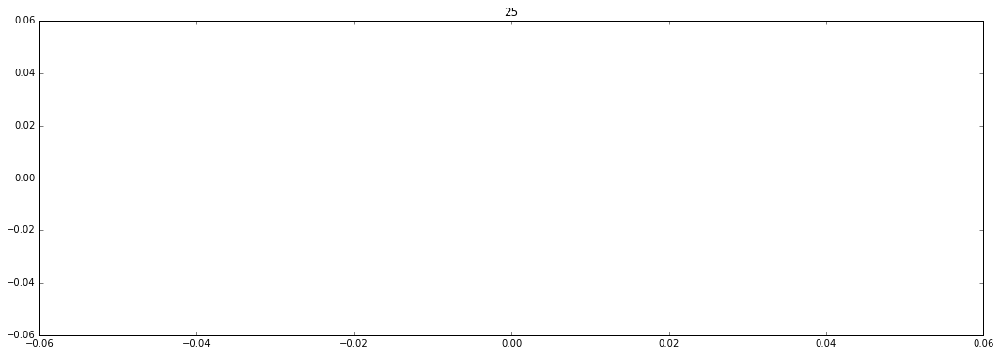

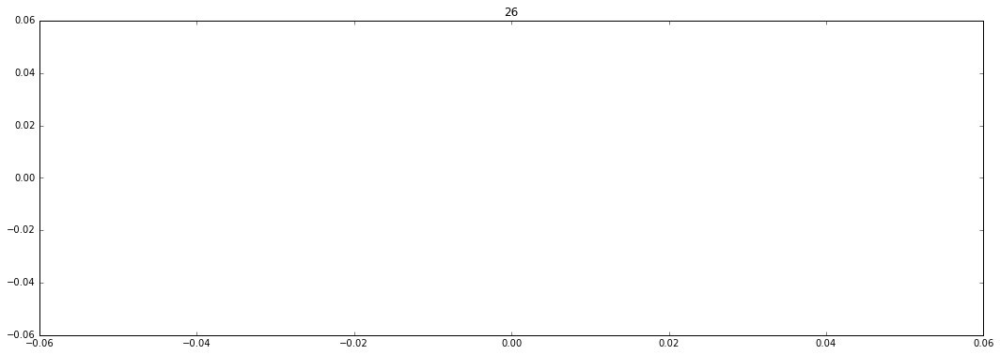

...

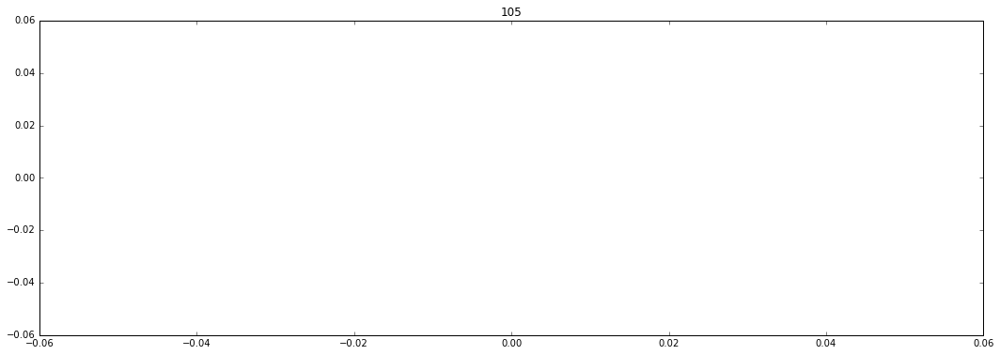

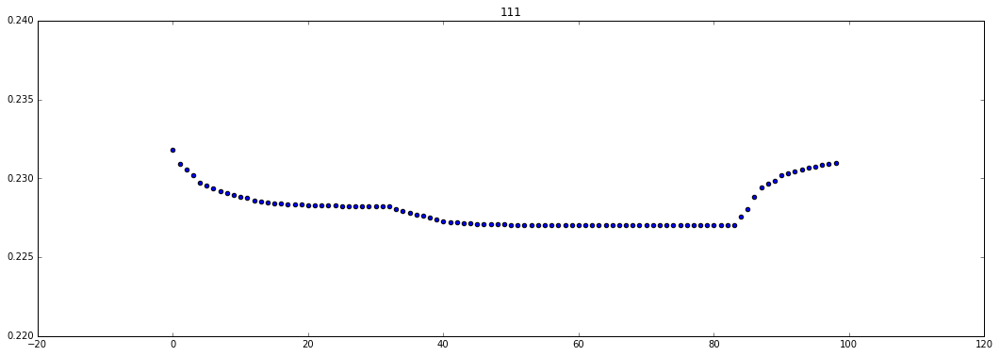

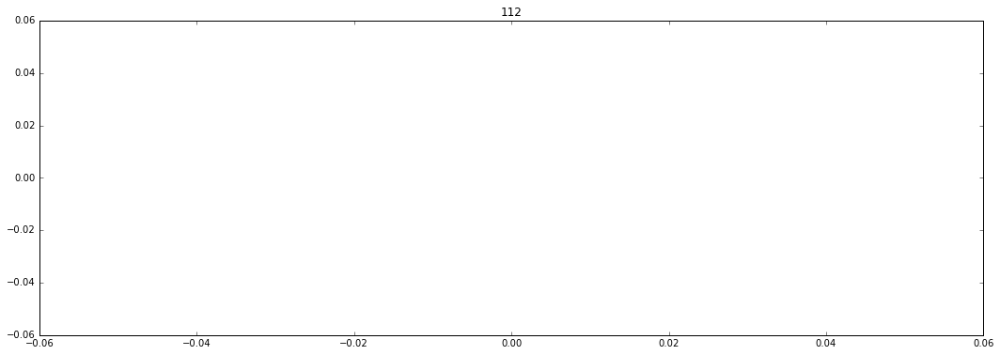

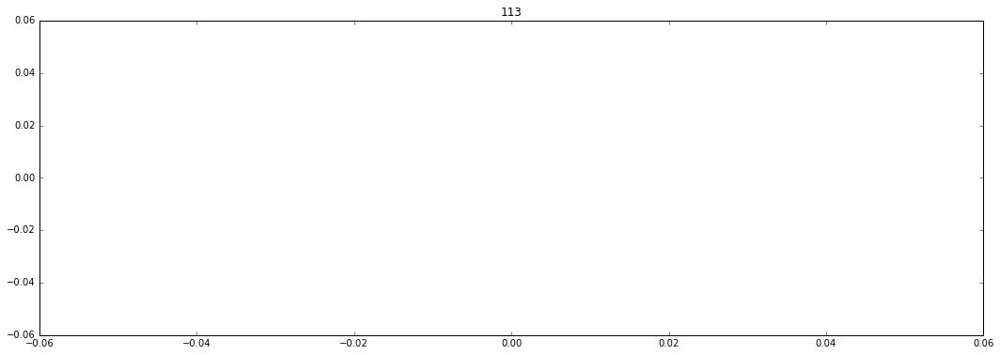

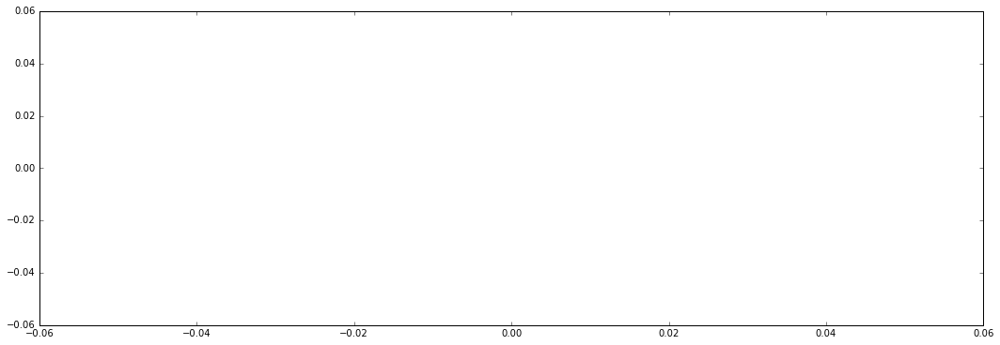

In [15]:
%pylab inline

for i in df.id[:40]:
    idx = df[df.id == i][['timestamp', 'fundamental_5']]
    plt.title(i)
    pylab.figure(figsize=(18, 6))
    pylab.scatter(idx.timestamp, idx.fundamental_5)

Populating the interactive namespace from numpy and matplotlib


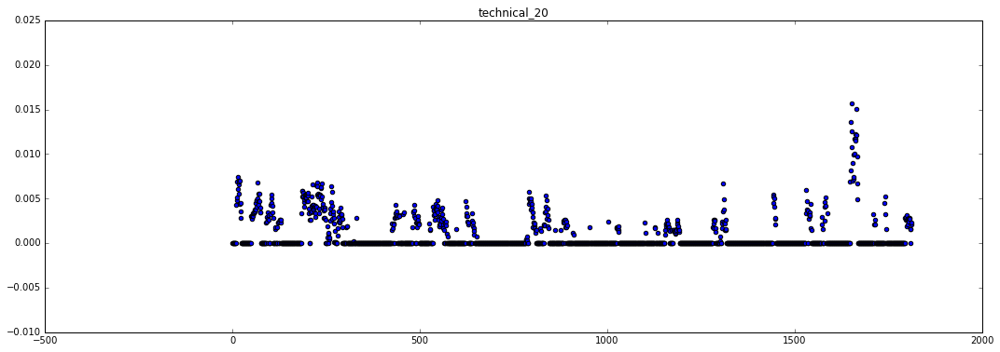

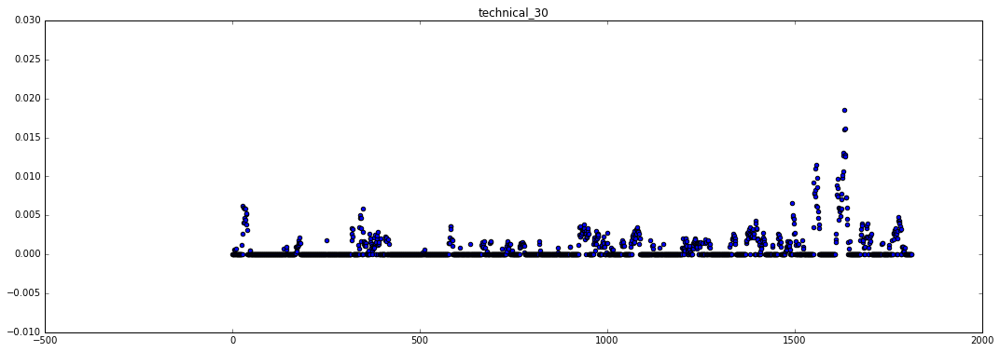

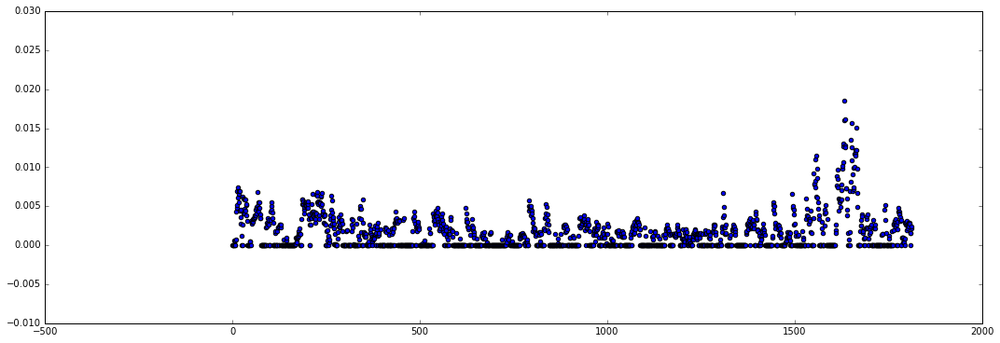

In [11]:
%pylab inline
idx = df[df.id == 41]
pylab.figure(figsize=(18, 6))
pylab.scatter(idx.timestamp, idx['technical_20'])
plt.title('technical_20')
pylab.figure(figsize=(18, 6))
pylab.scatter(idx.timestamp, idx['technical_30'])
plt.title('technical_30')

pylab.figure(figsize=(18, 6))
pylab.scatter(idx.timestamp, idx['technical_30'] + idx['technical_20'])

Populating the interactive namespace from numpy and matplotlib


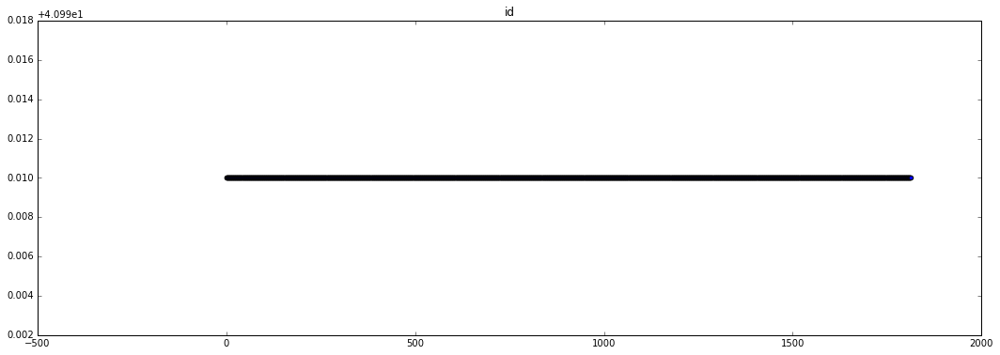

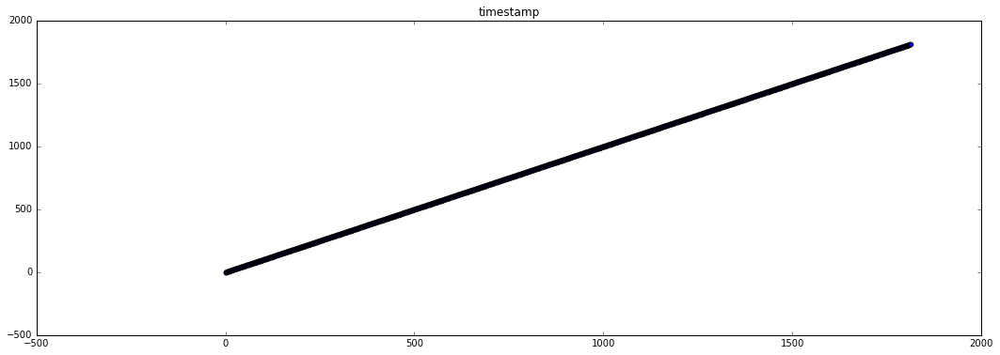

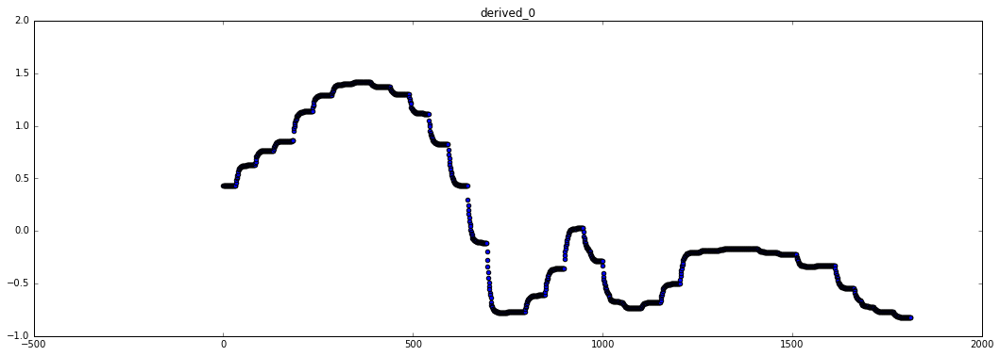

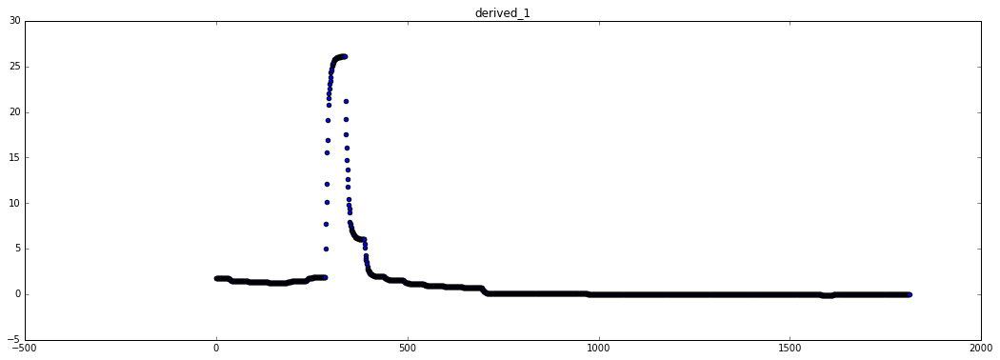

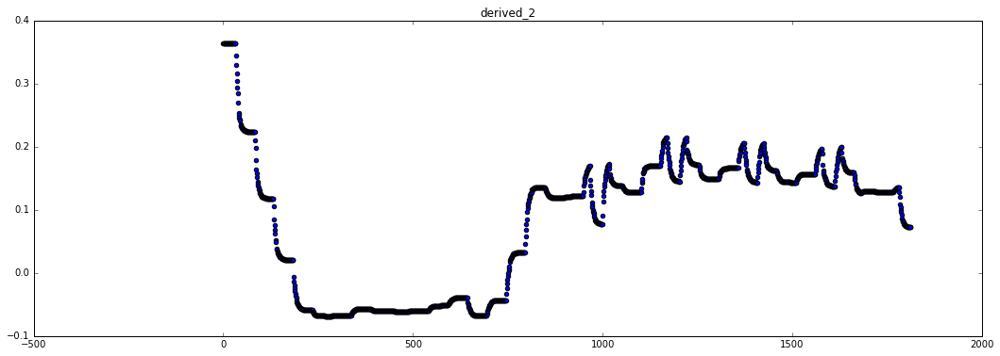

...

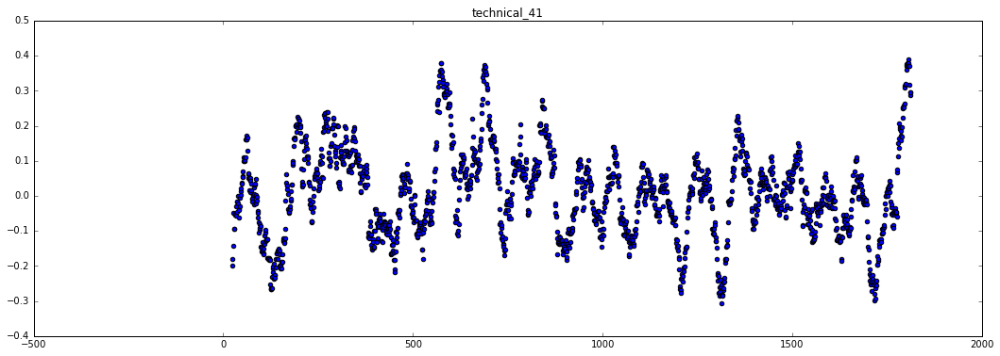

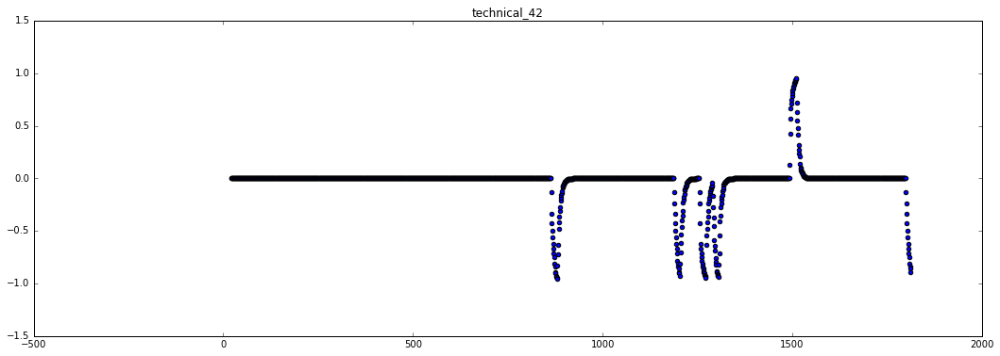

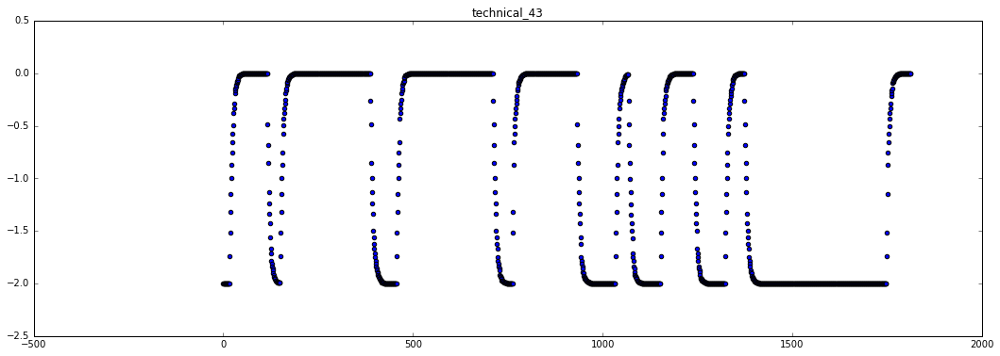

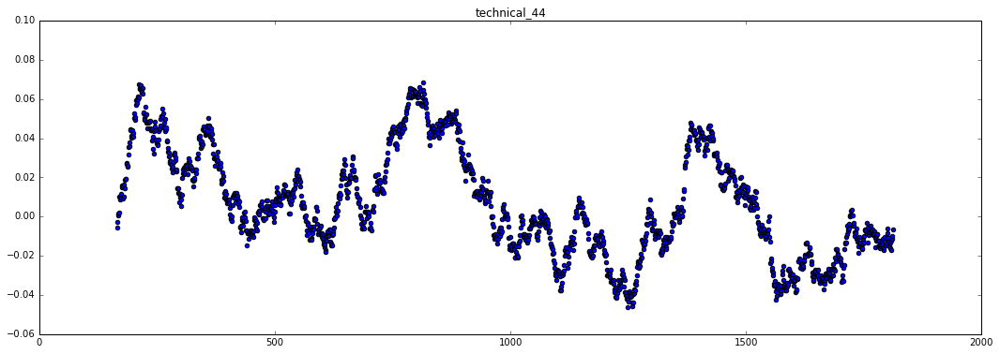

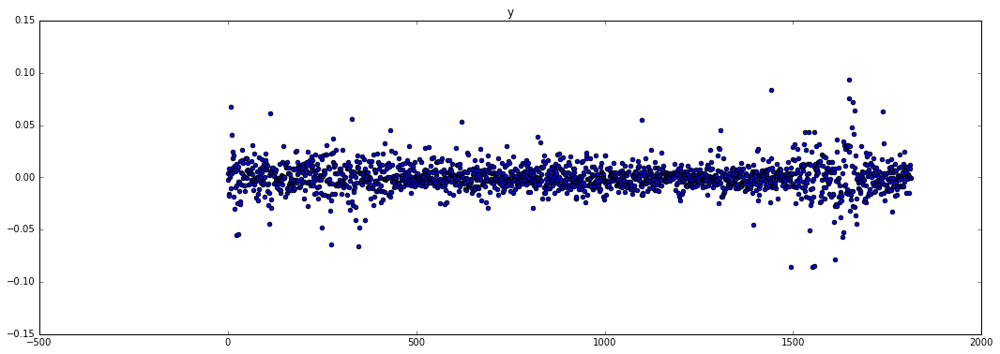

In [11]:
%pylab inline
idx = df[df.id == 41]
for i in idx.columns:
    pylab.figure(figsize=(18, 6))
    pylab.scatter(idx.timestamp, idx[i])
    plt.title(i)

In [37]:
id11.shape

(1813, 111)

In [23]:
x.shape

(1710756,)

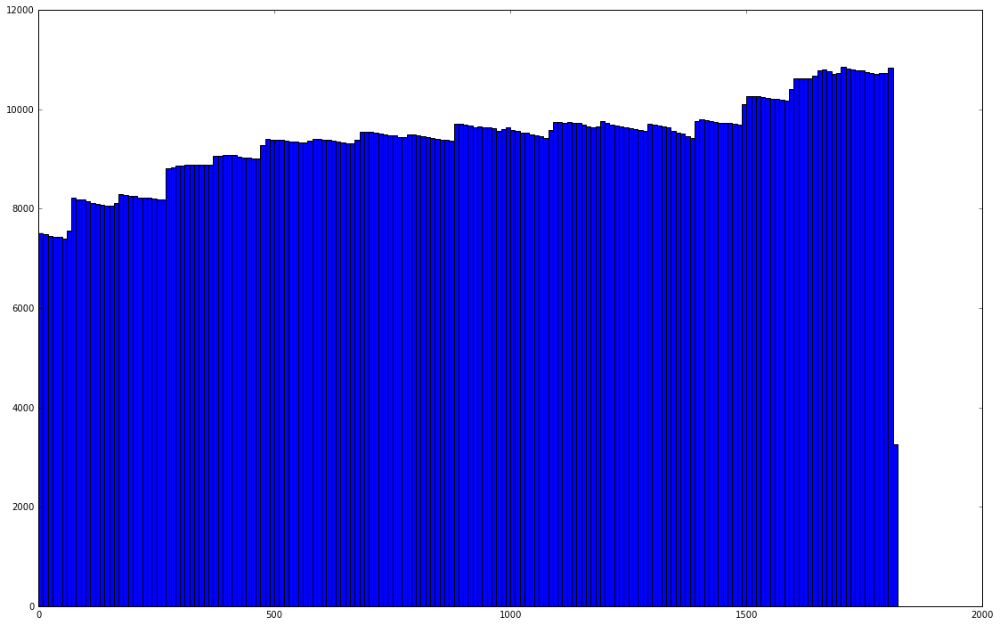

In [28]:
import matplotlib.pyplot as plt
 
x = df.timestamp
pylab.figure(figsize=(19, 12))
plt.hist(x, bins=200, range=(0, 2000))
plt.show()

In [18]:
%pylab inline
pylab.figure(figsize=(8, 6))
pylab.scatter(y, df.derived_0)

Populating the interactive namespace from numpy and matplotlib


NameError: name 'y' is not defined

In [79]:
time = df.groupby('timestamp').sum()

In [88]:
time_ave = df.groupby('timestamp').mean()

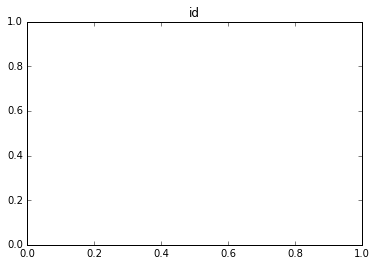

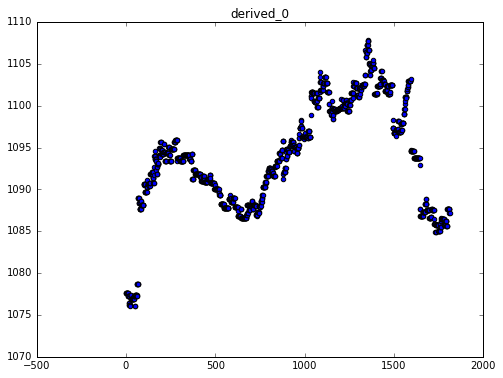

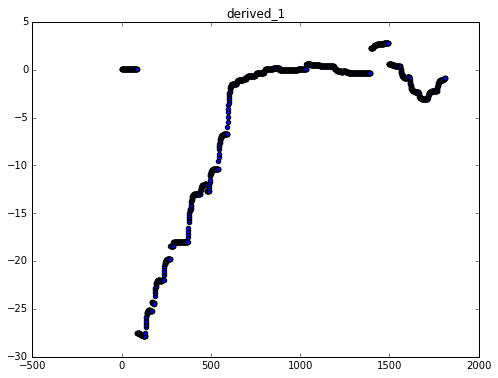

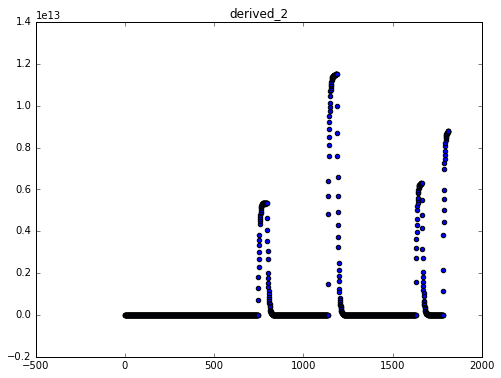

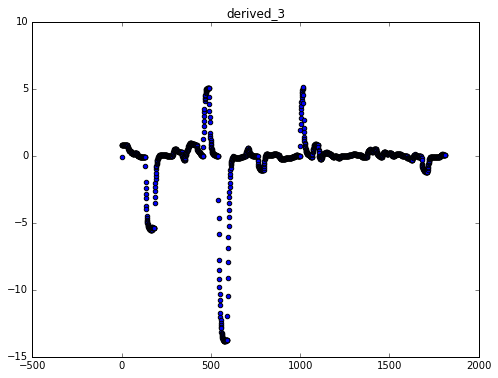

...

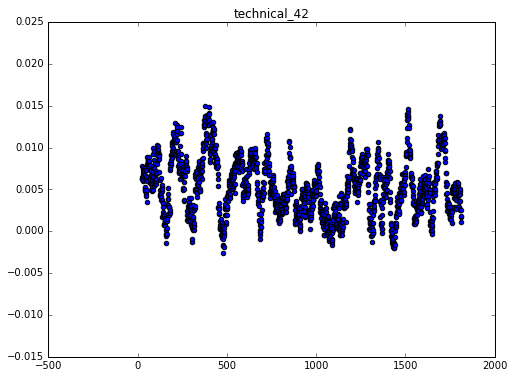

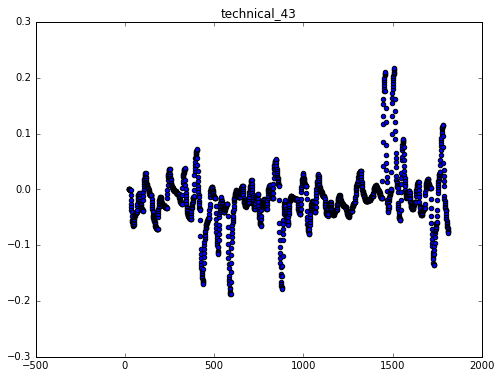

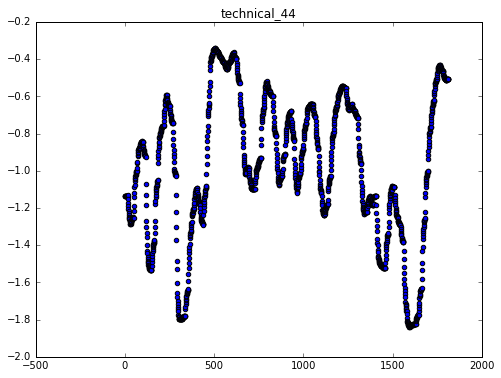

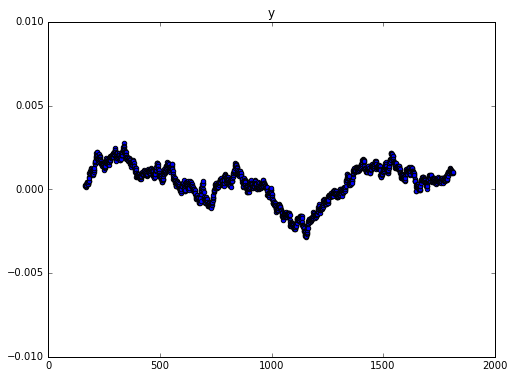

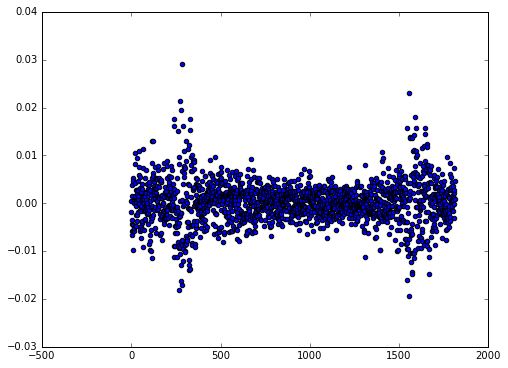

In [89]:
for i in time_ave.columns[:]:
    x = time_ave[i]
    plt.title(i)
    pylab.figure(figsize=(8, 6))
    pylab.scatter(time.index, x)

/home/ubuntu/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


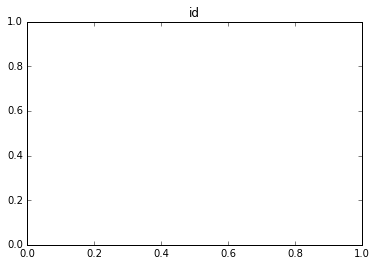

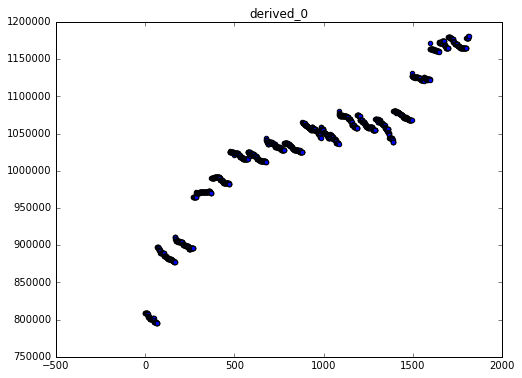

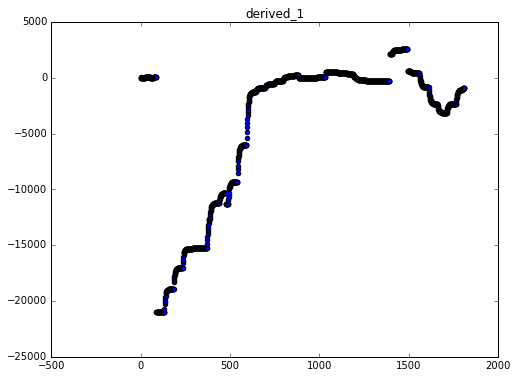

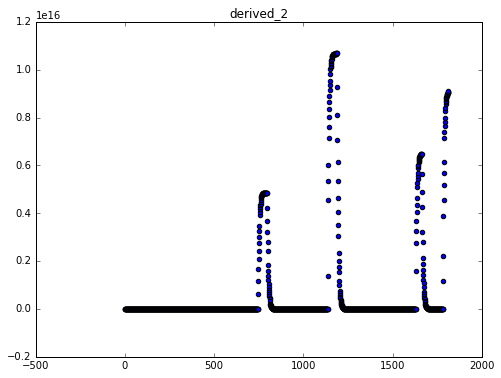

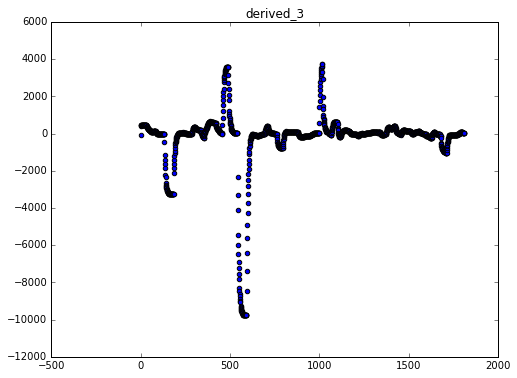

...

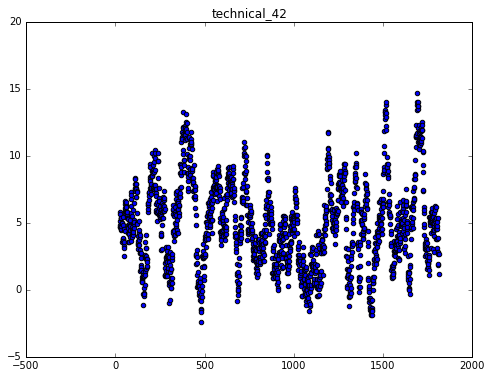

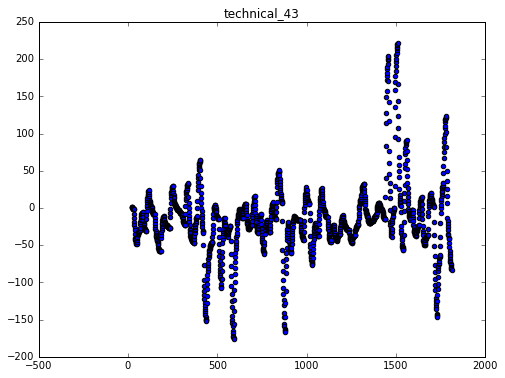

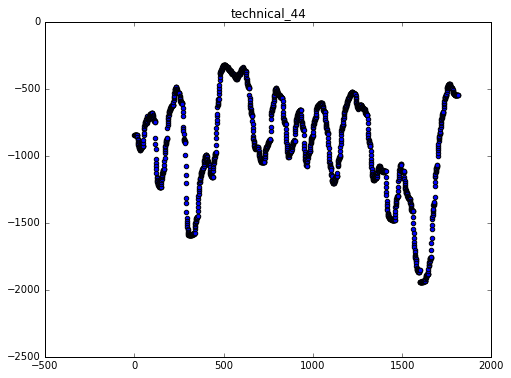

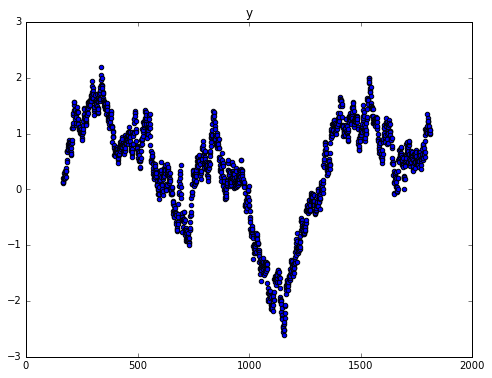

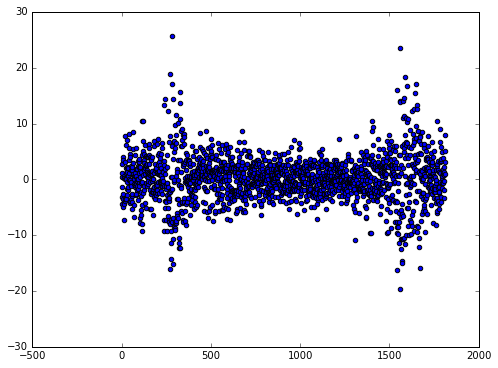

In [87]:
for i in time.columns[:]:
    x = time[i]
    plt.title(i)
    pylab.figure(figsize=(8, 6))
    pylab.scatter(time.index, x)

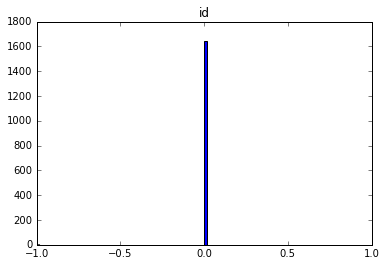

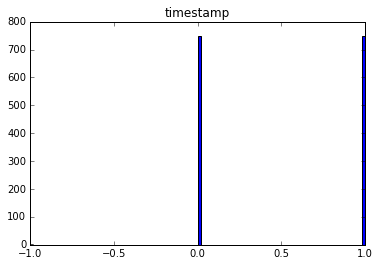

/home/ubuntu/anaconda2/lib/python2.7/site-packages/numpy/lib/function_base.py:583: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= mn)
/home/ubuntu/anaconda2/lib/python2.7/site-packages/numpy/lib/function_base.py:584: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= mx)


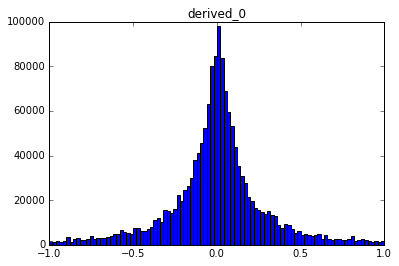

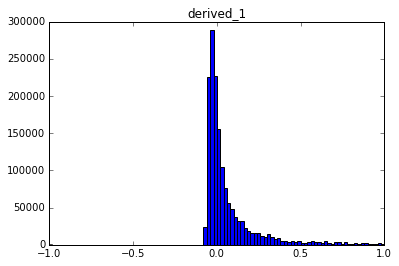

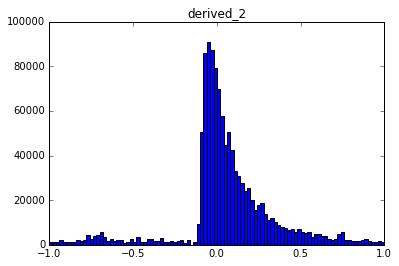

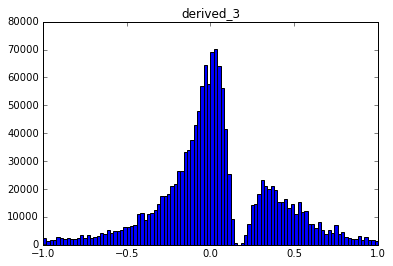

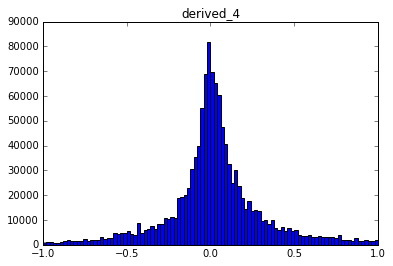

...

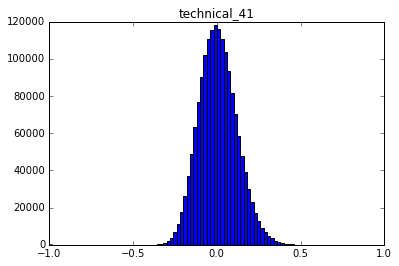

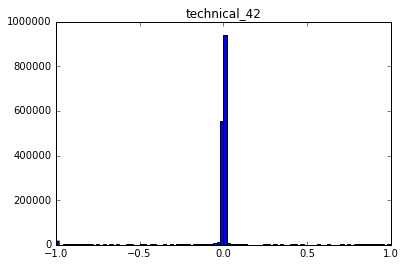

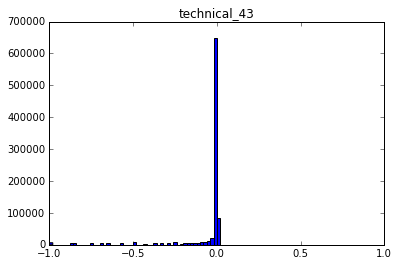

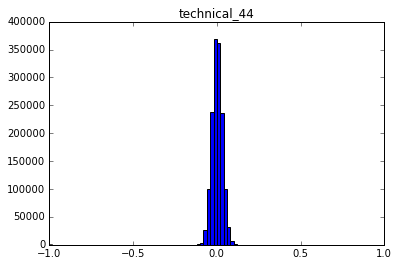

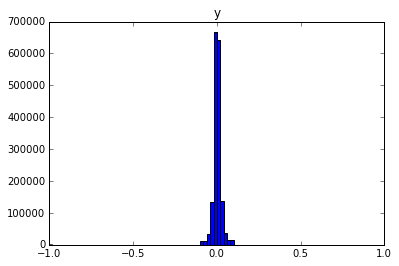

In [67]:
for i in df.columns[:]:
    x = df[i]
    plt.title(i)
    plt.hist(x, bins=100, range=(-1, 1))
    plt.show()

/home/ubuntu/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: divide by zero encountered in log


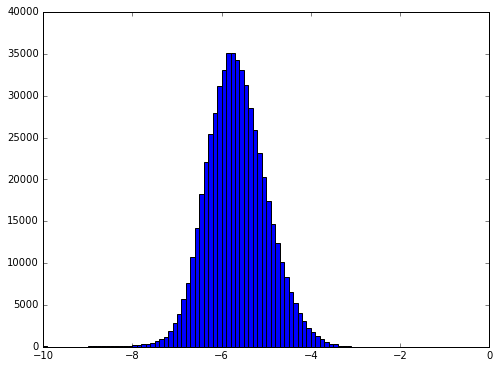

In [23]:
x = df.technical_20
#plt.title(i)
pylab.figure(figsize=(8, 6))
plt.hist(np.log(x), bins=100, range=(-10, 0))
plt.show()

In [ ]:
for i in df.columns[:]:
    x = df[i]
    plt.title(i)
    pylab.figure(figsize=(8, 6))
    pylab.scatter(y, x)

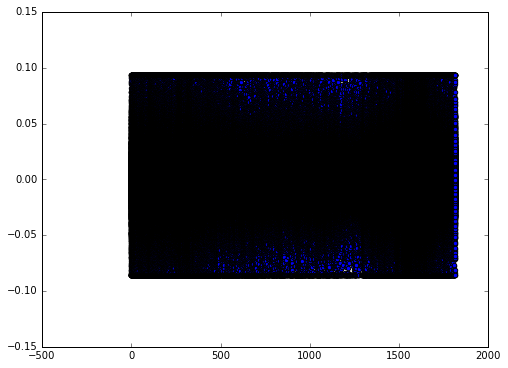

In [18]:
x = df.timestamp
pylab.figure(figsize=(8, 6))
pylab.scatter(x, y)

/home/ubuntu/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:2: FutureWarning: sort is deprecated, use sort_values(inplace=True) for INPLACE sorting
  from ipykernel import kernelapp as app


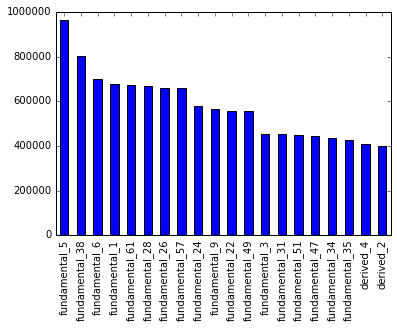

In [25]:
Z1 = df.isnull().sum()
Z1.sort(ascending = False)
Z1[:20].plot(kind = "bar")
plt.show()

In [90]:
y = df.y
del df['y']

In [91]:
d_mean= df.median(axis=0)
df.fillna(d_mean, inplace = True)
2

2

In [180]:
r = df[['fundamental_53', 'technical_20']]

In [181]:
r = pd.DataFrame(r)

In [207]:
train_data, test_data, train_labels, test_labels = cross_validation.train_test_split(df, y, 
                                                                                     test_size = 0.5)

## lin_reg

In [183]:
reg = LinearRegression()
reg.fit(train_data, train_labels)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [184]:
linear_pred = reg.predict(test_data)

In [185]:
r_metric(test_labels, linear_pred)

0.016297092179639292

## XGB

In [208]:
import xgboost as xgb
dtrain = xgb.DMatrix(data = train_data, label = train_labels)
param = {'max_depth':6,
         'eta':0.25,
         'silent':1,
         'objective':'reg:linear',
         'min_child_weight': 8}
num_round =30

In [209]:
bst = xgb.train(param, dtrain, num_round)


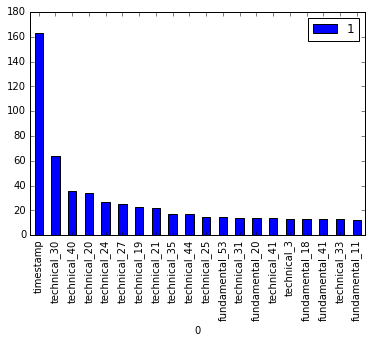

In [210]:
imp = pd.DataFrame(bst.get_fscore().items()).sort_values(1, ascending=False)
imp.index = imp[0]
imp[:20].plot(kind = "bar")
plt.show()

In [211]:
boost_pred = bst.predict(xgb.DMatrix(data = test_data))


In [212]:
r_metric(test_labels, boost_pred)

0.11251709430505651

## Forest

In [215]:
forest_regressor = sklearn.ensemble.RandomForestRegressor(n_estimators=4,
                                       criterion='mse',
                                       max_depth=3,
                                       min_samples_split=2,
                                       min_samples_leaf=1,
                                       min_weight_fraction_leaf=0.0,
                                       max_features='auto',
                                       max_leaf_nodes=None,
                                       bootstrap=True,
                                       oob_score=False,
                                       n_jobs=1,
                                       random_state=None)

In [216]:
forest_regressor.fit(train_data, train_labels)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=3,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_split=1e-07, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=4, n_jobs=1, oob_score=False, random_state=None,
           verbose=0, warm_start=False)

In [217]:
forest_pred = forest_regressor.predict(test_data)

In [218]:
r_metric(test_labels, forest_pred)

0.043514243523797271

In [206]:
boost_pred

array([  3.15248966e-04,   4.51415777e-04,   6.12139702e-05, ...,
         3.15248966e-04,   4.51415777e-04,   3.15248966e-04], dtype=float32)

In [200]:
linear_pred[:39]

array([  4.33673604e-04,   4.44347087e-04,   2.58643504e-04,
        -8.14978226e-05,   4.39584304e-04,  -1.42625153e-03,
         4.40232189e-04,   4.43100302e-04,   4.49319115e-04,
         4.34092588e-04,   4.28701694e-04,   4.40084023e-04,
         4.28241427e-04,   4.37974264e-04,   1.81552048e-04,
         4.35194306e-04,   4.32403040e-04,  -1.27831769e-03,
         1.03639983e-04,   4.41007726e-04,   4.37497113e-04,
         4.33420518e-04,   4.53354785e-04,   4.30455664e-04,
         4.46529045e-04,  -9.74544699e-04,  -6.54596474e-04,
         2.51088623e-04,   4.43737655e-04,   4.33572515e-04,
        -3.75488546e-05,   4.34422099e-04,  -1.08664520e-03,
         4.34771199e-04,   4.43649136e-04,   4.37818347e-04,
         4.34804034e-04,   4.38825875e-04,   4.35066309e-04])